<a href="https://colab.research.google.com/github/YIBOWAN200168/Colab/blob/main/Med_Image_Gen_Label_Cond_LDM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Generating Medical Images with the Label-Conditioned Latent Diffusion Model (From Scratch)**

## **Important Libraries**

### **Install**

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
pip install lightning

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 818.9/818.9 kB 34.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 38.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 41.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 27.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 88.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 57.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

### **Import**

In [3]:
import lightning as L
from lightning.pytorch import Trainer, seed_everything
from lightning.pytorch.callbacks import ModelCheckpoint

from torchmetrics.image import LearnedPerceptualImagePatchSimilarity

from google.colab.patches import cv2_imshow

import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import torch.nn.functional as F

from torchvision.transforms.v2 import Compose, Lambda, ToTensor, Resize

# from medmnist import PneumoniaMNIST
# from medmnist.info import INFO

from tqdm.auto import tqdm

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from IPython.display import Image as ImageColab

import os
import cv2
import random
import math
import copy

import warnings

warnings.filterwarnings("ignore")

%matplotlib inline
plt.rcParams['axes.facecolor'] = 'lightgray'
plt.rcParams['mathtext.fontset'] = 'cm'
plt.rcParams['font.family'] = 'STIXGeneral'

## **Configuration**

In [59]:
os.makedirs("drive/MyDrive/experiment", exist_ok=True)
os.makedirs("drive/MyDrive/experiment/training", exist_ok=True)
os.makedirs("drive/MyDrive/experiment/dataset", exist_ok=True)
os.makedirs("drive/MyDrive/experiment/model", exist_ok=True)
EXPERIMENT_DIR = "drive/MyDrive/experiment/"

In [5]:
METRIC_TO_MONITOR = {
    "VAE": "val_lpips",
    "LDM": "ema_loss",
}
METRIC_MODE = {
    "VAE": "min",
    "LDM": "min",
}

In [6]:
SEED = int(np.random.randint(2147483647))
print(f"Random seed: {SEED}")

Random seed: 793994746


In [7]:
MODEL = dict()
BEST_MODEL_PATH = dict()

In [8]:
BATCH_SIZE = {
    'train': 22,
    'val': 4,
    'test': 13,
}
LEARNING_RATE = 3e-4
MAX_EPOCH = 24
GAN_START = 144

In [9]:
DIFFUSION_STEP = 1000
BETA_START = 1e-4
BETA_END = 2e-2
SCALE_DOWN = 5
# LABEL = {
#     key: int(val) for val, key in INFO[PneumoniaMNIST.flag]["label"].items()
# }

In [ ]:
# print(LABEL)

{'normal': 0, 'pneumonia': 1}


## **Dataset**

### **Utils**

In [10]:
IMAGE_SIZE = 256
IMAGE_TRANSFORM = Compose(
    [
        Resize(IMAGE_SIZE),
        ToTensor(),
        Lambda(lambda x: (x * 2) - 1),
    ]
)

MASK_TRANSFORM = Compose(
    [
        Resize(IMAGE_SIZE),
        ToTensor()
    ]
)

### BraTSDatasetSegmentation（仅用于测试时加载 tumor 图像和其对应 mask）

In [12]:
import os
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image


class BraTSDataset(Dataset):
    def __init__(self, img_dir, mask_dir, transform=None, mask_transform=None):
        self.image_paths = sorted([
            os.path.join(img_dir, f)
            for f in os.listdir(img_dir)
            if f.endswith('.png') and '_flair_' in f
        ])
        self.mask_dir = mask_dir
        self.transform = transform if transform else transforms.ToTensor()
        self.mask_transform = mask_transform if mask_transform else transforms.ToTensor()

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        img = Image.open(img_path)
        if self.transform:
            img = self.transform(img)

        # 获取对应 mask 文件路径
        mask_name = os.path.basename(img_path).replace('_flair_', '_seg_')
        mask_path = os.path.join(self.mask_dir, mask_name)
        mask = Image.open(mask_path)
        if self.mask_transform:
            mask = self.mask_transform(mask)

        return img, mask


In [ ]:
dataset = BraTSDataset(
    img_dir='drive/MyDrive/experiment/dataset/BraTS2021/test/tumor',
    mask_dir='drive/MyDrive/experiment/dataset/BraTS2021/test/annotation',
    transform=IMAGE_TRANSFORM,
    mask_transform=MASK_TRANSFORM
)

img, mask = dataset[0]
print(img.shape, mask.shape)

In [30]:
from torch.utils.data import random_split

class MedicalDataModule(L.LightningDataModule):
    def __init__(self, data_dir="drive/MyDrive/experiment/dataset/BraTS2021", size=224):
        super().__init__()
        self.split = ["train", "test", "val"]
        self.data_dir = data_dir
        self.size = size

        self.train_dataset = None
        self.val_dataset = None
        self.test_dataset = None


    def setup(self, stage=None):
        if stage == "fit" or stage is None:
            full_dataset = BraTSDataset(os.path.join(self.data_dir, "train"), transform=IMAGE_TRANSFORM)
            val_size = int(0.2 * len(full_dataset))
            train_size = len(full_dataset) - val_size
            self.train_dataset, self.val_dataset = random_split(full_dataset, [train_size, val_size])

        if stage == "test" or stage is None:
            test_tumor_dir = os.path.join(self.data_dir, "test", "tumor")
            annotation_dir = os.path.join(self.data_dir, "test", "annotation")
            self.test_dataset = BraTSDataset(
                        test_tumor_dir,
                        mask_dir=annotation_dir,
                        transform=IMAGE_TRANSFORM,
                        mask_transform=IMAGE_TRANSFORM
                      )


    def train_dataloader(self):
        return data.DataLoader(self.train_dataset, batch_size=BATCH_SIZE["train"], shuffle=True, num_workers=2)

    def val_dataloader(self):
        return data.DataLoader(self.val_dataset, batch_size=BATCH_SIZE["val"], num_workers=2)

    def test_dataloader(self):
        return data.DataLoader(self.test_dataset, batch_size=BATCH_SIZE["test"], num_workers=2)


In [34]:
datamodule = MedicalDataModule(data_dir="drive/MyDrive/experiment/dataset/BraTS2021")

# ✅ 调用 setup() 初始化数据集（必须）
datamodule.setup()

# ✅ 打印数据集大小
print("Train set size:", len(datamodule.train_dataset))
print("Val set size  :", len(datamodule.val_dataset))
print("Test set size :", len(datamodule.test_dataset))

TypeError: BraTSDataset.__init__() missing 1 required positional argument: 'mask_dir'

### image-level

In [149]:
import os
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image

class BraTSDataset(Dataset):
    def __init__(self, img_dirs, transform=None, labeled = False):
        if isinstance(img_dirs, str):
            img_dirs = [img_dirs]


        self.image_paths = []
        self.labels = []
        self.labeled = labeled

        for d in img_dirs:
            label = 0 if "normal" in d.lower() else 1  # 正常为 0，肿瘤为 1
            files = [os.path.join(d, f) for f in os.listdir(d)
                     if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
            self.image_paths.extend(files)
            self.labels.extend([label] * len(files))

        self.transform = transform if transform else transforms.ToTensor()

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        img = Image.open(img_path)
        img = self.transform(img)
        label = self.labels[idx]
        return img, label


In [150]:
sample = next(iter(test_loader))
print(type(sample))
print(len(sample))
print(sample[0].shape)  # 图像
print(sample[1].shape)  # 标签


<class 'torch.Tensor'>
13
torch.Size([1, 256, 256])
torch.Size([1, 256, 256])


In [146]:
from torch.utils.data import random_split

class MedicalDataModule(L.LightningDataModule):
    def __init__(self, data_dir="drive/MyDrive/experiment/dataset/BraTS2021", size=224):
        super().__init__()
        self.split = ["train", "test", "val"]
        self.data_dir = data_dir
        self.size = size

        self.train_dataset = None
        self.val_dataset = None
        self.test_dataset = None


    def setup(self, stage=None):
        if stage == "fit" or stage is None:
            full_dataset = BraTSDataset(os.path.join(self.data_dir, "train"), transform=IMAGE_TRANSFORM)
            val_size = int(0.2 * len(full_dataset))
            train_size = len(full_dataset) - val_size
            self.train_dataset, self.val_dataset = random_split(full_dataset, [train_size, val_size])

        if stage == "test" or stage is None:
            test_normal = os.path.join(self.data_dir, "test", "normal")
            test_tumor = os.path.join(self.data_dir, "test", "tumor")
            self.test_dataset = BraTSDataset(
                [test_normal, test_tumor],
                 transform=IMAGE_TRANSFORM
                # labeled=True  # 加标签用于评估
            )
    def train_dataloader(self):
        return data.DataLoader(self.train_dataset, batch_size=BATCH_SIZE["train"], shuffle=True, num_workers=2)

    def val_dataloader(self):
        return data.DataLoader(self.val_dataset, batch_size=BATCH_SIZE["val"], num_workers=2)

    def test_dataloader(self):
        return data.DataLoader(self.test_dataset, batch_size=BATCH_SIZE["test"], num_workers=2)


In [147]:
datamodule = MedicalDataModule(data_dir="drive/MyDrive/experiment/dataset/BraTS2021")

# ✅ 调用 setup() 初始化数据集（必须）
datamodule.setup()

# ✅ 打印数据集大小
print("Train set size:", len(datamodule.train_dataset))
print("Val set size  :", len(datamodule.val_dataset))
print("Test set size :", len(datamodule.test_dataset))

Train set size: 3369
Val set size  : 842
Test set size : 2776


### **Load**

In [116]:
DATASET = MedicalDataModule()

## **Latent Diffusion Model**

### **Utils**

In [118]:
class AvgMeter(object):
    def __init__(self, num=40):
        self.num = num
        self.reset()

    def reset(self):
        self.scores = []

    def update(self, val):
        self.scores.append(val)

    def show(self):
        out = torch.mean(
            torch.stack(
                self.scores[np.maximum(len(self.scores)-self.num, 0):]
            )
        )
        return out

### **Variational Auto Encoder**

#### **Model**

##### **Block**

In [119]:
class ConvNormAct(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        kernel_size,
        norm_channel=None,
        norm=True,
        act=True,
        **kwargs
    ):
        super().__init__()

        layers = [
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                padding=kernel_size // 2,
                bias=not norm,
                **kwargs
            )
        ]
        if norm:
            assert norm_channel is not None
            layers.append(nn.GroupNorm(norm_channel, out_channels))
        if act:
            layers.append(nn.SiLU())

        self.block = nn.Sequential(*layers)

    def forward(self, x):
        return self.block(x)

In [120]:
class Residual(nn.Module):
    def __init__(self, fn):
        super().__init__()
        self.fn = fn

    def forward(self, x):
        return self.fn(x) + x

In [121]:
class VAEDownBlock(nn.Module):
    def __init__(self, in_channels, out_channels, n_group):
        super().__init__()

        self.block = nn.Sequential(
            ConvNormAct(
                in_channels,
                in_channels,
                kernel_size=3,
                norm_channel=n_group,
            ),
            ConvNormAct(
                in_channels,
                out_channels,
                kernel_size=3,
                norm_channel=n_group,
            ),
            Residual(
                ConvNormAct(
                    out_channels,
                    out_channels,
                    kernel_size=3,
                    norm_channel=n_group,
                )
            ),
            nn.Conv2d(
                out_channels,
                out_channels,
                kernel_size=4,
                stride=2,
                padding=1,
            ),
        )

    def forward(self, x):
        return self.block(x)

In [122]:
class VAEUpBlock(nn.Module):
    def __init__(self, in_channels, out_channels, n_group):
        super().__init__()

        self.block = nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                in_channels,
                kernel_size=4,
                stride=2,
                padding=1,
            ),
            ConvNormAct(
                in_channels,
                in_channels,
                kernel_size=3,
                norm_channel=n_group,
            ),
            ConvNormAct(
                in_channels,
                out_channels,
                kernel_size=3,
                norm_channel=n_group,
            ),
            Residual(
                ConvNormAct(
                    out_channels,
                    out_channels,
                    kernel_size=3,
                    norm_channel=n_group,
                )
            ),
        )

    def forward(self, x):
        return self.block(x)

##### **VAE**

In [123]:
class VQVAE(nn.Module):
    def __init__(
        self,
        image_channel=1,
        base_channel=16,
        latent_dim=3,
        codebook_size=4096,
    ):
        super().__init__()

        ####### Vector Quantized
        self.codebook = torch.Tensor(codebook_size, latent_dim).to(
            "cuda" if torch.cuda.is_available() else "cpu"
        )
        # This is important for restricting the latent image values range
        self.codebook.uniform_(-1.0, 1.0)

        ####### Encoder
        self.input_conv = ConvNormAct(
            image_channel,
            4 * base_channel,
            kernel_size=3,
            norm_channel=base_channel,
        )
        self.encoder_conv = nn.Sequential(
            VAEDownBlock(4 * base_channel, 4 * base_channel, base_channel),
            VAEDownBlock(4 * base_channel, 8 * base_channel, base_channel),
            VAEDownBlock(8 * base_channel, 16 * base_channel, base_channel),
        )
        self.encoder_latent_proj = nn.Conv2d(
            16 * base_channel,
            latent_dim,
            kernel_size=1,
        )

        ####### Decoder
        self.decoder_latent_proj = nn.Conv2d(
            latent_dim,
            16 * base_channel,
            kernel_size=1,
        )
        self.decoder_conv = nn.Sequential(
            VAEUpBlock(16 * base_channel, 8 * base_channel, base_channel),
            VAEUpBlock(8 * base_channel, 4 * base_channel, base_channel),
            VAEUpBlock(4 * base_channel, 4 * base_channel, base_channel),
        )
        self.output_conv = nn.Conv2d(
            4 * base_channel,
            image_channel,
            kernel_size=3,
            padding=1,
            bias=True,
        )

    def encode(self, x, inference=False):
        x = self.input_conv(x)
        x = self.encoder_conv(x)
        x = self.encoder_latent_proj(x)
        if not inference:
            x, loss = self.quantize(x)
            return x, loss
        else:
            x = self.quantize(x, inference)
            return x

    def quantize(self, x, inference=False):
        B, C, H, W = x.shape

        # B, C, H, W -> B, H, W, C
        x = x.permute(0, 2, 3, 1)

        # B, H, W, C -> B, H*W, C
        x = x.reshape(x.size(0), -1, x.size(-1))


        ################ Find nearest embedding/codebook vector ################

        # dist between (B, H*W, C) and (B, K, C) -> (B, H*W, K)
        dist = torch.cdist(
            x,
            self.codebook[None, :].repeat((x.size(0), 1, 1)),
        )

        # (B, H*W)
        min_encoding_indices = torch.argmin(dist, dim=-1)


        ############# Replace encoder output with nearest codebook #############

        # x -> B*H*W, C
        x = x.reshape((-1, x.size(-1)))

        # quant_out -> B*H*W, C
        quant_out = torch.index_select(
            self.codebook,
            dim=0,
            index=min_encoding_indices.view(-1),
        )

        ############################ Calculate Loss ############################

        if not inference:
            commmitment_loss = torch.mean((quant_out.detach() - x) ** 2)
            codebook_loss = torch.mean((quant_out - x.detach()) ** 2)
            quantize_loss = (
                codebook_loss
                + commmitment_loss
            )

        ############################### Estimate ###############################

        quant_out = x + (quant_out - x).detach()

        # quant_out -> B, C, H, W
        quant_out = quant_out.reshape((B, H, W, C)).permute(0, 3, 1, 2)

        if not inference:
            return quant_out, quantize_loss

        return quant_out

    def decode(self, x):
        x = self.decoder_latent_proj(x)
        x = self.decoder_conv(x)
        x = self.output_conv(x)
        x = F.hardtanh(x)
        return x

    def forward(self, x, inference=False):
        if not inference:
            z, loss = self.encode(x)
        else:
            z = self.encode(x)

        x = self.decode(z)

        if not inference:
            return x, loss

        return x

#### **Loss Function**

In [124]:
class VAELoss(nn.Module):
    def __init__(self):
        super().__init__()

        self.reconstruction_loss = nn.MSELoss()

    def forward(self, x, x_hat, vq_loss):

        # Reconstruction Loss
        recon_loss = self.reconstruction_loss(x_hat, x)

        return recon_loss + vq_loss # VQ Loss

#### **Wrapper**

In [125]:
class VAEWrapper(L.LightningModule):
    def __init__(self):
        super().__init__()

        self.model = VQVAE()
        self.loss = VAELoss()

        self.batch_size = BATCH_SIZE
        self.lr = LEARNING_RATE
        self.max_epoch = MAX_EPOCH

        self.train_lpips = LearnedPerceptualImagePatchSimilarity()
        self.val_lpips = LearnedPerceptualImagePatchSimilarity()
        self.test_lpips = LearnedPerceptualImagePatchSimilarity()

        self.train_lpips.eval()
        self.val_lpips.eval()
        self.test_lpips.eval()

        self.train_lpips_recorder = AvgMeter()
        self.val_lpips_recorder = AvgMeter()

        self.train_lpips_list = list()
        self.val_lpips_list = list()

        self.train_loss_recorder = AvgMeter()
        self.val_loss_recorder = AvgMeter()

        self.train_loss = list()
        self.val_loss = list()

        self.sanity_check_counter = 1

        self.automatic_optimization = False

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, _ = batch

        x_hat, vq_loss = self(x)
        loss = self.loss(x, x_hat, vq_loss)

        opt = self.optimizers()
        opt.zero_grad()
        self.manual_backward(loss)
        opt.step()

        self.log("train_loss", loss, prog_bar=True)
        self.train_loss_recorder.update(loss.data)

        self.train_lpips.update(
            x_hat.repeat(1, 3, 1, 1),
            x.repeat(1, 3, 1, 1),
        )
        lpips = self.train_lpips.compute().data.cpu()
        self.train_lpips_recorder.update(lpips.data)
        self.log("train_lpips", lpips, prog_bar=True)

    def on_train_epoch_end(self):
        mean = self.train_loss_recorder.show()
        self.train_loss.append(mean.data.cpu().numpy())
        self.train_loss_recorder = AvgMeter()

        mean = self.train_lpips_recorder.show()
        self.train_lpips_list.append(mean.data.cpu().numpy())
        self.train_lpips_recorder = AvgMeter()

        self._plot_evaluation_metrics()

    def validation_step(self, batch, batch_idx):
        x, _ = batch

        x_hat, vq_loss = self(x)
        loss = self.loss(x, x_hat, vq_loss)

        if self.sanity_check_counter == 0:
            self.log("val_loss", loss, prog_bar=True)
            self.val_loss_recorder.update(loss.data)

            self.val_lpips.update(
                x_hat.repeat(1, 3, 1, 1),
                x.repeat(1, 3, 1, 1),
            )
            lpips = self.val_lpips.compute().data.cpu()

            self.log("val_lpips", lpips, prog_bar=True)

            self.val_lpips_recorder.update(lpips.data)

    def on_validation_epoch_end(self):
        if self.sanity_check_counter == 0:
            mean = self.val_loss_recorder.show()
            self.val_loss.append(mean.data.cpu().numpy())
            self.val_loss_recorder = AvgMeter()

            mean = self.val_lpips_recorder.show()
            self.val_lpips_list.append(mean.data.cpu().numpy())
            self.val_lpips_recorder = AvgMeter()
        else:
            self.sanity_check_counter -= 1

    def test_step(self, batch, batch_idx):
        x, _ = batch

        x_hat, vq_loss = self(x)
        loss = self.loss(x, x_hat, vq_loss)

        self.log("test_loss", loss, prog_bar=True, logger=True)

        self.test_lpips.update(
            x_hat.repeat(1, 3, 1, 1),
            x.repeat(1, 3, 1, 1),
        )

        self.log(
            "test_lpips", self.test_lpips.compute(), prog_bar=True, logger=True
        )

    def _plot_evaluation_metrics(self):
        # VAE Loss
        vae_loss_img_file = os.path.join(
            EXPERIMENT_DIR,
            "VAE_loss_plot.png"
        )
        plt.plot(self.train_loss, color="r", label="train")
        plt.plot(self.val_loss, color="b", label="validation")
        plt.title("VAE Loss Curves")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid()
        plt.savefig(vae_loss_img_file)
        plt.clf()

        # LPIPS
        lpips_img_file = os.path.join(
            EXPERIMENT_DIR,
            "VAE_lpips_plot.png"
        )
        plt.plot(self.train_lpips_list, color="r", label="train")
        plt.plot(self.val_lpips_list, color="b", label="validation")
        plt.title("LPIPS Curves")
        plt.xlabel("Epoch")
        plt.ylabel("LPIPS")
        plt.legend()
        plt.grid()
        plt.savefig(lpips_img_file)
        plt.clf()

    def configure_optimizers(self):

        optimizer = optim.AdamW(
            self.model.parameters(),
            lr=self.lr,
        )

        return optimizer

In [126]:
MODEL['VAE'] = VAEWrapper
BEST_MODEL_PATH['VAE'] = os.path.join(
    EXPERIMENT_DIR,
    "model",
    "VAE_best.ckpt",
)

#### **Training**

In [ ]:
def _train_loop():
    seed_everything(SEED, workers=True)

    print("\n=================[ Variational Auto Encoder ]=================\n")

    model = MODEL['VAE']()

    callbacks = list()

    checkpoint = ModelCheckpoint(
        monitor=METRIC_TO_MONITOR["VAE"],
        dirpath=os.path.join(EXPERIMENT_DIR, "model"),
        mode=METRIC_MODE["VAE"],
        filename="VAE_best",
    )
    callbacks.append(checkpoint)

    if os.path.exists(BEST_MODEL_PATH['VAE']):
        ckpt_path = BEST_MODEL_PATH['VAE']
    else:
        ckpt_path = None

    trainer = Trainer(
        accelerator="auto",
        devices=1,
        max_epochs=MAX_EPOCH,
        logger=False,
        callbacks=callbacks,
        log_every_n_steps=5,
    )
    trainer.fit(model, ckpt_path=ckpt_path, datamodule=DATASET)

_train_loop()

INFO: Seed set to 2023723591
INFO:lightning.fabric.utilities.seed:Seed set to 2023723591



=================[ Variational Auto Encoder ]=================



Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 135MB/s]
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
100%|██████████| 214M/214M [00:18<00:00, 11.6MB/s]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name        | Type                                  | Params | Mode 
------------------------------------------------------------------------------
0 | model       | VQVAE                                 | 5.6 M  | train
1 | loss        | 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=24` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=24` reached.


<Figure size 640x480 with 0 Axes>

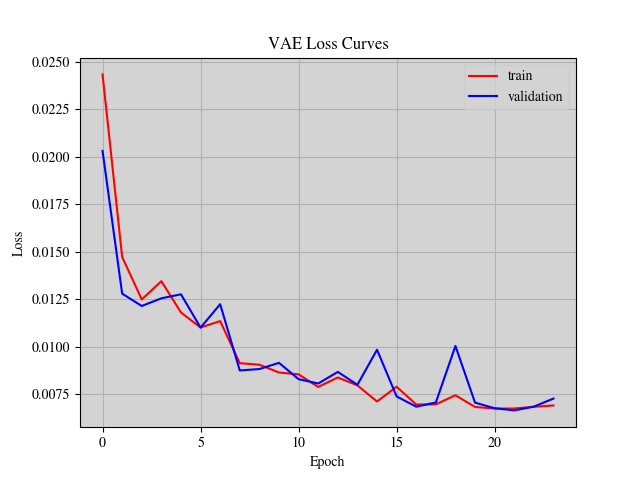

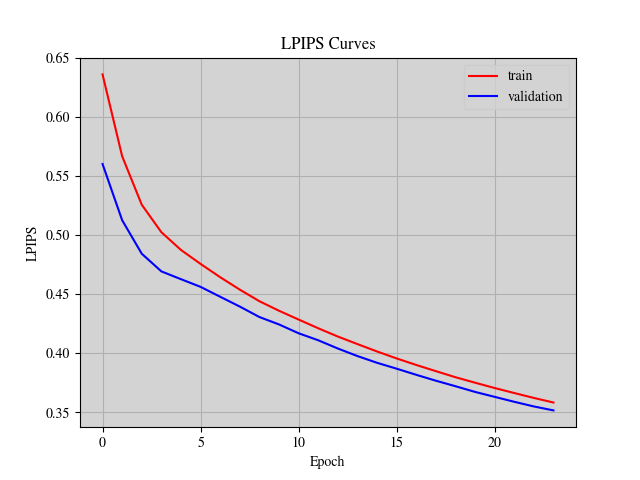

In [ ]:
cv2_imshow(
    cv2.imread(os.path.join(EXPERIMENT_DIR, "VAE_loss_plot.png"))
)
cv2_imshow(
    cv2.imread(os.path.join(EXPERIMENT_DIR, "VAE_lpips_plot.png"))
)

#### **Testing**

In [ ]:
def _test_loop():
    trainer = Trainer(accelerator='auto', logger=False)
    model = MODEL['VAE']()
    trainer.test(
        model=model,
        ckpt_path=BEST_MODEL_PATH['VAE'],
        datamodule=DATASET,
    )

_test_loop()

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 158MB/s]
100%|██████████| 214M/214M [00:11<00:00, 18.4MB/s]
INFO: Restoring states from the checkpoint path at experiment/model/VAE_best.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at experiment/model/VAE_best.ckpt
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: Loaded model weights from the checkpoint at

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   0.007005349732935429    │
│        test_lpips         │    0.27090010046958923    │
└───────────────────────────┴───────────────────────────┘

#### **Reconstruction Quality**

In [43]:
DATASET.prepare_data()
DATASET.setup('test')
test_loader = DATASET.test_dataloader()



==================={ VQ-VAE Reconstruction }===================


Noise Range: -0.9996182 to 0.9995502

Noise Level: 0.0%
Latent Image Range: -1.0 to 0.957


<Figure size 640x480 with 0 Axes>

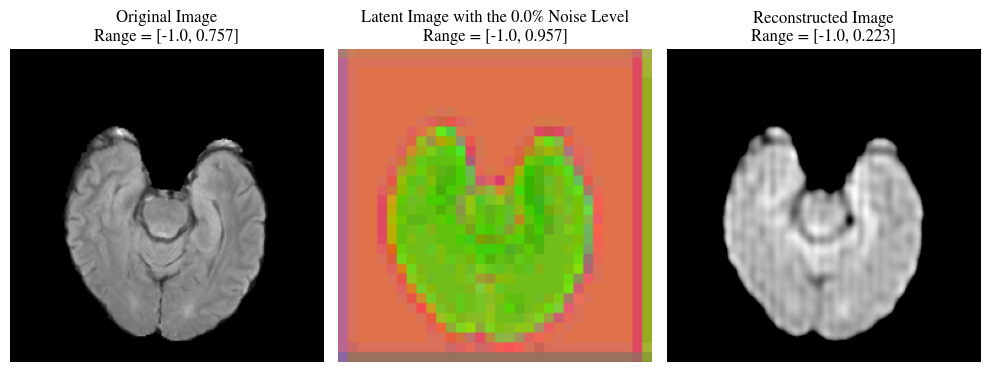


Noise Level: 11.11%
Latent Image Range: -0.987 to 0.948


<Figure size 640x480 with 0 Axes>

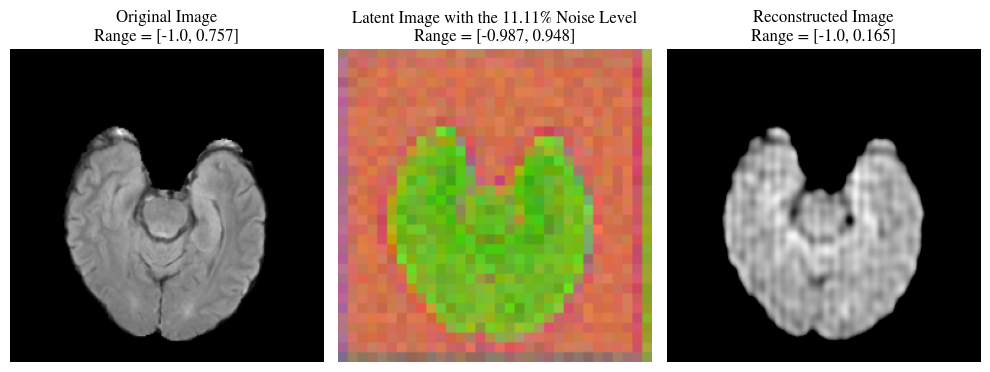


Noise Level: 22.22%
Latent Image Range: -0.974 to 0.938


<Figure size 640x480 with 0 Axes>

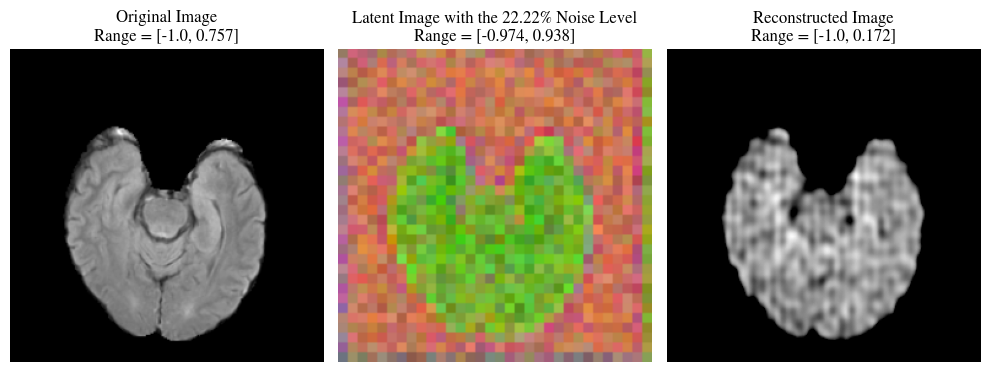


Noise Level: 33.33%
Latent Image Range: -0.963 to 0.928


<Figure size 640x480 with 0 Axes>

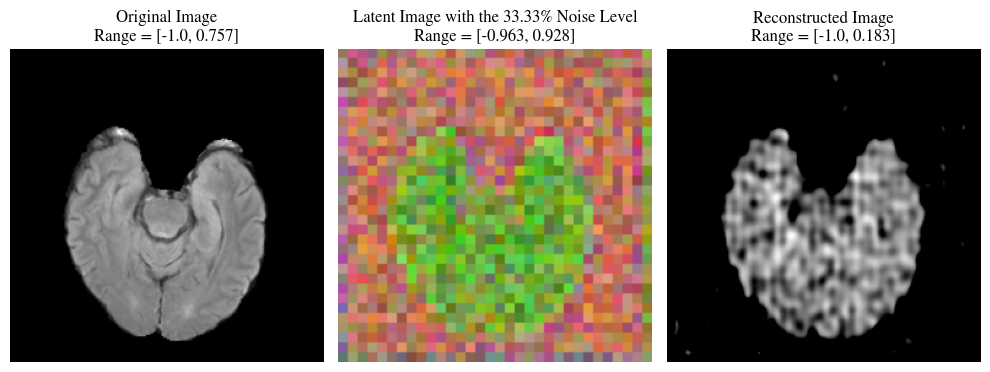


Noise Level: 44.44%
Latent Image Range: -0.964 to 0.918


<Figure size 640x480 with 0 Axes>

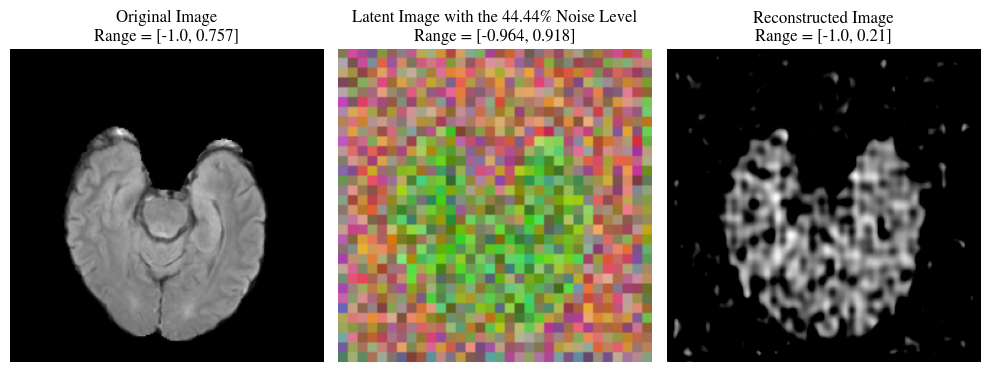


Noise Level: 55.56%
Latent Image Range: -0.966 to 0.908


<Figure size 640x480 with 0 Axes>

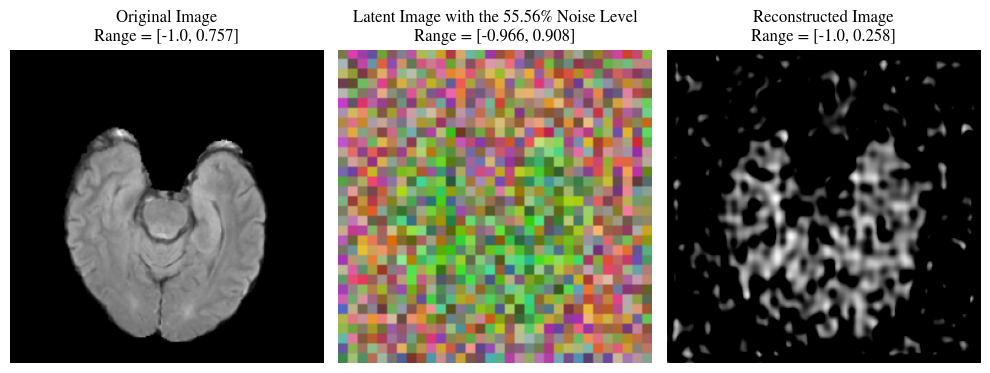


Noise Level: 66.67%
Latent Image Range: -0.967 to 0.918


<Figure size 640x480 with 0 Axes>

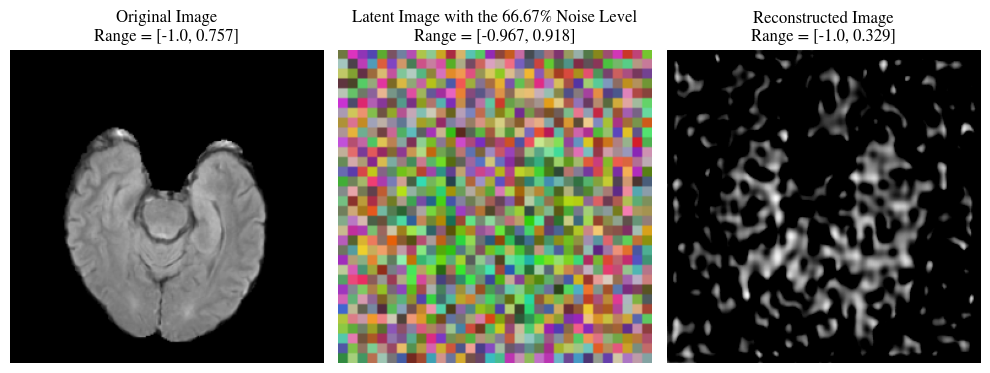


Noise Level: 77.78%
Latent Image Range: -0.968 to 0.945


<Figure size 640x480 with 0 Axes>

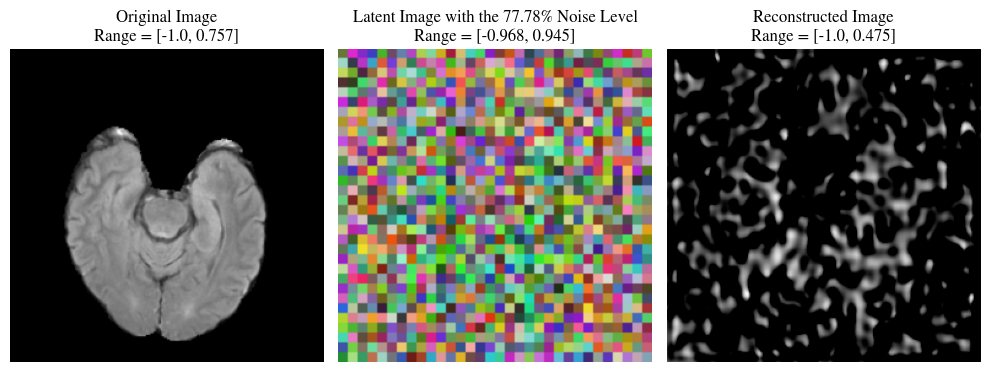


Noise Level: 88.89%
Latent Image Range: -0.969 to 0.972


<Figure size 640x480 with 0 Axes>

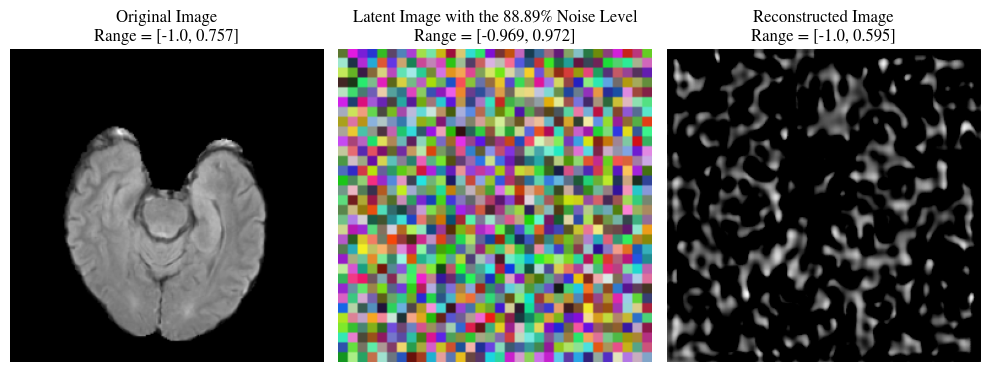


Noise Level: 100.0%
Latent Image Range: -1.0 to 1.0


<Figure size 640x480 with 0 Axes>

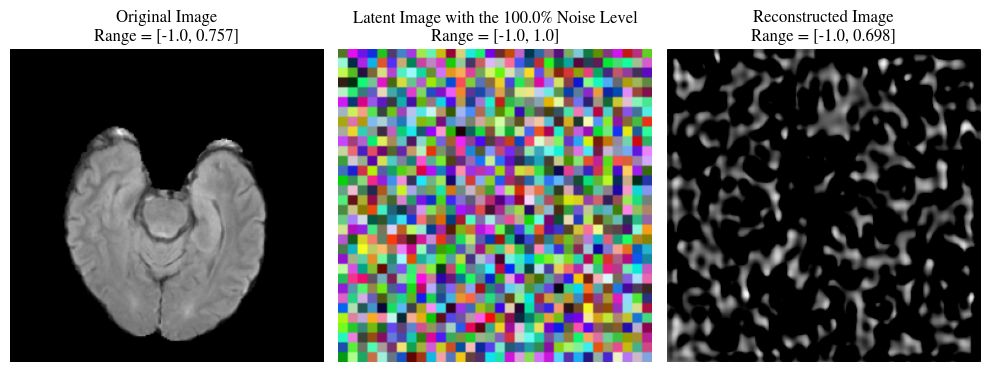

In [44]:
# Load the best model
model = VAEWrapper.load_from_checkpoint(BEST_MODEL_PATH['VAE']).model
model.eval()

# Get a sample image from the dataset
image = next(iter(test_loader))
random_idx = np.random.randint(0, len(image))
image = image[random_idx:random_idx+1].to(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("\n\n==================={ VQ-VAE Reconstruction }===================\n\n")

# print(
#     "Label:",
#     list(LABEL.keys())[int(cls[random_idx:random_idx+1].cpu().numpy())]
# )

scale_factor = 8

noise = torch.randn_like(
    torch.randn(1, 3, IMAGE_SIZE // scale_factor, IMAGE_SIZE // scale_factor)
).to(
    "cuda" if torch.cuda.is_available() else "cpu"
)
torch.nn.init.uniform_(noise, -1., 1.)
print(
    "Noise Range:", noise.min().cpu().numpy(), "to", noise.max().cpu().numpy()
)

for scale in np.linspace(0, 1, 10):
    x_min = 0.
    x_max = 0.
    x_hat_min = 0.
    x_hat_max = 0.
    z_min = 0.
    z_max = 0.

    # Reconstruct the image using the loaded model
    with torch.no_grad():
        print(f"\nNoise Level: {round(scale * 100., 2)}%")
        z = model.encode(image, inference=True)
        z = (1. - scale) * z + scale * noise
        z_min = round(float(z.min().cpu().numpy()), 3)
        z_max = round(float(z.max().cpu().numpy()), 3)
        print(f"Latent Image Range: {z_min} to {z_max}")
        x = model.decode(z)

    # Process the output image
    z = F.interpolate(z, scale_factor=4, mode="nearest")
    z = torch.clamp(z, -1., 1.)
    latent_image = z.squeeze(0).permute(1, 2, 0).cpu().numpy()
    latent_image = (latent_image + 1) / 2
    latent_image = (latent_image * 255).astype("uint8")

    x_hat_min = round(float(x.min().cpu().numpy()), 3)
    x_hat_max = round(float(x.max().cpu().numpy()), 3)
    x = torch.clamp(x, -1., 1.)
    reconstructed_image = x.squeeze(0).permute(1, 2, 0).cpu().numpy()
    reconstructed_image = (reconstructed_image + 1) / 2
    reconstructed_image = (reconstructed_image * 255).astype("uint8")

    # Process the original image for display
    x_min = round(float(image.min().cpu().numpy()), 3)
    x_max = round(float(image.max().cpu().numpy()), 3)
    original_image = image.squeeze(0).permute(1, 2, 0).cpu().numpy()
    original_image = (original_image + 1) / 2
    original_image = (original_image * 255).astype("uint8")

    plt.clf()

    # Display images
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title(f"Original Image\nRange = [{x_min}, {x_max}]")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(latent_image, cmap='gray')
    plt.title(
        f"Latent Image with the {round(scale * 100., 2)}% Noise Level\n"
        f"Range = [{z_min}, {z_max}]"
    )
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(reconstructed_image, cmap='gray')
    plt.title(f"Reconstructed Image\nRange = [{x_hat_min}, {x_hat_max}]")
    plt.axis('off')

    plt.tight_layout()

    plt.show()

### **Diffusion Model**

#### **Model**

##### **Exponential Moving Average**

In [127]:
class EMA(object):
    def __init__(self, beta=0.9):
        super().__init__()
        self.beta = beta
        self.step = 0

    def update_model_average(self, ma_model, current_model):
        for current_params, ma_params in zip(
            current_model.parameters(), ma_model.parameters()
        ):
            old_weight, up_weight = ma_params.data, current_params.data
            ma_params.data = self.update_average(old_weight, up_weight)

    def update_average(self, old, new):
        if old is None:
            return new

        return old * self.beta + (1 - self.beta) * new

    def step_ema(self, ema_model, model, step_start_ema=1024):
        self.step += 1

        if self.step < step_start_ema:
            self.reset_parameters(ema_model, model)
            return None

        self.update_model_average(ema_model, model)
        self.step += 1

    def reset_parameters(self, ema_model, model):
        ema_model.load_state_dict(model.state_dict())

##### **DDPM (Denoising Diffusion Probabilistic Models)**

In [128]:
class DDPMScheduler(nn.Module):
    def __init__(
        self,
        T=DIFFUSION_STEP,
        beta_start=BETA_START,
        beta_end=BETA_END,
    ):
        super().__init__()

        self.T = T
        self.beta = torch.linspace(beta_start, beta_end, T).to(
            "cuda" if torch.cuda.is_available() else "cpu"
        )
        self.alpha = 1. - self.beta
        self.alpha_hat = torch.cumprod(self.alpha, dim=0)

    def forward(self, x, t, noise=None):
        sqrt_alpha_hat = torch.sqrt(self.alpha_hat[t])[:, None, None, None]
        sqrt_one_minus_alpha_hat = torch.sqrt(
            1 - self.alpha_hat[t]
        ).unsqueeze(1).unsqueeze(1).unsqueeze(1)

        if noise is None:
            noise = torch.randn_like(x)
            torch.nn.init.uniform_(noise, -1., 1.)

        x_noisy = sqrt_alpha_hat * x + sqrt_one_minus_alpha_hat * noise

        return x_noisy, noise

In [129]:
FORWARD_MODEL = DDPMScheduler

##### **U-Net**

###### **Block**

In [130]:
class SelfAttention(nn.Module):
    def __init__(self, channels, size):
        super().__init__()
        self.channels = channels
        self.size = size

        self.mha = nn.MultiheadAttention(channels, 4, batch_first=True)
        self.ln = nn.LayerNorm([channels])
        self.ff_self = nn.Sequential(
            nn.LayerNorm([channels]),
            nn.Linear(channels, channels),
            nn.GELU(),
            nn.Linear(channels, channels),
        )

    def forward(self, x):
        x = x.view(-1, self.channels, self.size * self.size).swapaxes(1, 2)
        x_ln = self.ln(x)
        attention_value, _ = self.mha(x_ln, x_ln, x_ln)
        attention_value = attention_value + x
        attention_value = self.ff_self(attention_value) + attention_value
        return attention_value.swapaxes(2, 1).view(
            -1, self.channels, self.size, self.size,
        )

In [131]:
class DoubleConv(nn.Module):
    def __init__(
        self, in_channels, out_channels, mid_channels=None, residual=False,
    ):
        super().__init__()
        self.residual = residual
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(
                in_channels, mid_channels, kernel_size=3, padding=1, bias=False,
            ),
            nn.GroupNorm(1, mid_channels),
            nn.GELU(),
            nn.Conv2d(
                mid_channels, out_channels, kernel_size=3, padding=1, bias=False,
            ),
            nn.GroupNorm(1, out_channels),
        )

    def forward(self, x):
        if self.residual:
            return F.gelu(x + self.double_conv(x))
        else:
            return self.double_conv(x)

In [132]:
class Down(nn.Module):
    def __init__(self, in_channels, out_channels, emb_dim):
        super().__init__()

        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, in_channels, residual=True),
            DoubleConv(in_channels, out_channels),
        )

        self.emb_layer = nn.Sequential(
            nn.SiLU(),
            nn.Linear(
                emb_dim,
                out_channels
            ),
        )

    def forward(self, x, t):
        x = self.maxpool_conv(x)
        emb = self.emb_layer(t)[:, :, None, None].repeat(
            1, 1, x.shape[-2], x.shape[-1],
        )
        return x + emb

In [133]:
class Up(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        emb_dim
    ):
        super().__init__()

        self.up = nn.Upsample(
            scale_factor=2,
            mode="bilinear",
            align_corners=True,
        )
        self.conv = nn.Sequential(
            DoubleConv(in_channels, in_channels, residual=True),
            DoubleConv(in_channels, out_channels, in_channels // 2),
        )

        self.emb_layer = nn.Sequential(
            nn.SiLU(),
            nn.Linear(emb_dim, out_channels),
        )

    def forward(self, x, skip_x, t):
        x = self.up(x)
        x = torch.cat([skip_x, x], dim=1)
        x = self.conv(x)
        emb = self.emb_layer(t)[:, :, None, None].repeat(
            1, 1, x.shape[-2], x.shape[-1],
        )
        return x + emb

In [134]:
class PositionalEmbedding(nn.Module):
    def __init__(
        self,
        channels,
        device="cuda" if torch.cuda.is_available() else "cpu",
    ):
        super().__init__()
        self.channels = channels
        self.device = device

    def forward(self, time):
        inv_freq = 1.0 / (
            10000
            ** (
                torch.arange(0, self.channels, 2, device=self.device).float()
                / self.channels
            )
        )
        pos_enc_a = torch.sin(time.repeat(1, self.channels // 2) * inv_freq)
        pos_enc_b = torch.cos(time.repeat(1, self.channels // 2) * inv_freq)
        pos_enc = torch.cat([pos_enc_a, pos_enc_b], dim=-1)
        return pos_enc

###### **Model**

In [135]:
class UNet(nn.Module):
    def __init__(
        self,
        c_in=3,
        c_out=3,
        num_classes=2,
        time_dim=1280 // SCALE_DOWN,
        scale_factor=8,
        device="cuda" if torch.cuda.is_available() else "cpu",
    ):
        super().__init__()


        ##### Encoder
        self.input_conv = DoubleConv(c_in, 320 // SCALE_DOWN)

        self.down1 = Down(320 // SCALE_DOWN, 640 // SCALE_DOWN, time_dim)
        self.sa1 = SelfAttention(
            640 // SCALE_DOWN, (IMAGE_SIZE // scale_factor) // 2
        )

        self.down2 = Down(640 // SCALE_DOWN, 1280 // SCALE_DOWN, time_dim)
        self.sa2 = SelfAttention(
            1280 // SCALE_DOWN, (IMAGE_SIZE // scale_factor) // 4,
        )

        self.down3 = Down(1280 // SCALE_DOWN, 1280 // SCALE_DOWN, time_dim)
        self.sa3 = SelfAttention(
            1280 // SCALE_DOWN, (IMAGE_SIZE // scale_factor) // 8,
        )


        ##### Bridge or Bottleneck
        self.bridge = nn.Sequential(
            DoubleConv(1280 // SCALE_DOWN, 2560 // SCALE_DOWN),
            DoubleConv(2560 // SCALE_DOWN, 2560 // SCALE_DOWN),
            SelfAttention(
                2560 // SCALE_DOWN,
                (IMAGE_SIZE // scale_factor) // 8
            ),
            DoubleConv(2560 // SCALE_DOWN, 1280 // SCALE_DOWN),
        )


        ##### Decoder
        self.up1 = Up(
            2560 // SCALE_DOWN,
            640 // SCALE_DOWN,
            time_dim,
        )
        self.sa4 = SelfAttention(
            640 // SCALE_DOWN, (IMAGE_SIZE // scale_factor) // 4
        )

        self.up2 = Up(
            1280 // SCALE_DOWN,
            320 // SCALE_DOWN,
            time_dim,
        )
        self.sa5 = SelfAttention(
            320 // SCALE_DOWN, (IMAGE_SIZE // scale_factor) // 2
        )

        self.up3 = Up(
            640 // SCALE_DOWN,
            320 // SCALE_DOWN,
            time_dim,
        )
        self.sa6 = SelfAttention(
            320 // SCALE_DOWN, (IMAGE_SIZE // scale_factor)
        )

        self.out_conv = nn.Conv2d(320 // SCALE_DOWN, c_out, kernel_size=1)


        ##### Positional Embedding
        self.pos_encoding = PositionalEmbedding(time_dim, device)


        ##### Label Embedding
        self.label_emb = nn.Embedding(num_classes, time_dim)

    def forward(self, x, t, context=None):
        t = t.unsqueeze(-1).type(torch.float)
        t = self.pos_encoding(t)

        if context is not None:
            t += self.label_emb(context)


        #### Encoder
        x = self.input_conv(x)

        x1 = self.down1(x, t)
        x1 = self.sa1(x1)

        x2 = self.down2(x1, t)
        x2 = self.sa2(x2)

        x3 = self.down3(x2, t)
        x3 = self.sa3(x3)


        #### Bridge or Bottleneck
        bridge = self.bridge(x3)


        #### Decoder
        out = self.up1(bridge, x2, t)
        out = self.sa4(out)

        out = self.up2(out, x1, t)
        out = self.sa5(out)

        out = self.up3(out, x, t)
        out = self.sa6(out)

        out = self.out_conv(out)

        return out

In [136]:
BACKWARD_MODEL = UNet

#### **Wrapper**

In [137]:
class LatentDiffusionWrapper(L.LightningModule):
    def __init__(self, vae_model):
        super().__init__()

        self.forward_model = FORWARD_MODEL()
        self.backward_model = BACKWARD_MODEL()

        self.vae_model = vae_model
        self.vae_model.eval()

        for param in self.vae_model.parameters():
            param.requires_grad = False

        self.ema = EMA()
        self.ema_model = copy.deepcopy(self.backward_model)
        self.ema_model.eval()

        for param in self.ema_model.parameters():
            param.requires_grad = False

        self.batch_size = BATCH_SIZE
        self.lr = LEARNING_RATE
        self.max_epoch = MAX_EPOCH

        self.automatic_optimization = False

        self.train_loss_recorder = AvgMeter()
        self.train_loss_list = list()

        self.val_loss_recorder = AvgMeter()
        self.val_loss_list = list()

        self.ema_loss_recorder = AvgMeter()
        self.ema_loss_list = list()

        self.T = self.forward_model.T

        self.sanity_check_counter = 1

    def forward(
        self, x, t=None, ctx=None, inference=False, use_ema=False, cfg_scale=1.,
    ):
        if inference:
            return self.sample(x, use_ema=use_ema, cfg_scale=cfg_scale)

        assert t is not None, "Variable 't' can not be 'None'."

        x_latent, _ = self.vae_model.encode(x)
        x_latent_noisy, noise = self.forward_model(x_latent, t)
        if use_ema:
            noise_pred = self.ema_model(x_latent_noisy, t, ctx)
        else:
            noise_pred = self.backward_model(x_latent_noisy, t, ctx)

        return F.mse_loss(noise_pred, noise)

    def sample(
        self, ctx, n_progress=50, scale_factor=8, use_ema=False, cfg_scale=1.,
    ):

        if ctx is not None:
            ctx = torch.tensor(ctx).unsqueeze(0).to(
                "cuda" if torch.cuda.is_available() else "cpu"
            )

        if use_ema:
            self.ema_model.eval()
        else:
            self.backward_model.eval()

        progress_image = list()

        with torch.no_grad():

            x = torch.randn(
                1, 3, IMAGE_SIZE // scale_factor, IMAGE_SIZE // scale_factor
            ).to(self.device)
            torch.nn.init.uniform_(x, -1.0, 1.0)

            progress_image.append(x.detach())

            for i in tqdm(reversed(range(1, self.T)), position=0):
                t = (torch.ones(1) * i).long().to(self.device)

                if use_ema:
                    noise_pred = self.ema_model(x, t, ctx)
                else:
                    noise_pred = self.backward_model(x, t, ctx)

                if ctx is not None:
                    if use_ema:
                        uncond_noise_pred = self.ema_model(x, t, None)
                    else:
                        uncond_noise_pred = self.backward_model(x, t, None)

                    noise_pred = torch.lerp(
                        uncond_noise_pred,
                        noise_pred,
                        cfg_scale,
                    )

                alpha_hat = self.forward_model.alpha_hat[t][:, None, None, None]

                alpha = self.forward_model.alpha[t][:, None, None, None]
                beta = self.forward_model.beta[t][:, None, None, None]

                if i > 1:
                    noise = torch.randn_like(x)
                    torch.nn.init.uniform_(noise, -1.0, 1.0)
                else:
                    noise = torch.zeros_like(x)

                coef = beta / torch.sqrt(1. - alpha_hat)
                x = (x - coef * noise_pred) / torch.sqrt(alpha)

                variance = torch.sqrt(beta)
                x = x + variance * noise

                x = torch.clamp(x, -1.0, 1.0)

                if (i - 1) % (self.T // n_progress) == 0:
                    progress_image.append(x.detach())

        progress_image_decoded = [
            self.vae_model.decode(img).detach().cpu()
            for img in progress_image
        ]

        return progress_image, progress_image_decoded

    def training_step(self, batch, batch_idx):
        x = batch

        if np.random.random() < 0.2:
            ctx = None
        else:
            ctx = ctx.view(-1)

        t = torch.randint(
            1,
            self.T,
            (self.batch_size["train"],),
            device=self.device,
        ).long()

        loss = self(x, t, ctx)

        opt = self.optimizers()
        opt.zero_grad()
        self.manual_backward(loss, retain_graph=True)
        opt.step()

        self.ema.step_ema(self.ema_model, self.backward_model)

        self.log("train_loss", loss, prog_bar=True)
        self.train_loss_recorder.update(loss.data)

    def on_train_epoch_end(self):
        mean = self.train_loss_recorder.show()
        self.train_loss_list.append(mean.data.cpu().numpy())
        self.train_loss_recorder = AvgMeter()

        self._plot_evaluation_metrics()

    def validation_step(self, batch, batch_idx):
        x, ctx = batch

        ctx = ctx.view(-1)

        t = torch.randint(
            1,
            self.T,
            (self.batch_size["val"],),
            device=self.device,
        ).long()

        loss = self(x, t, ctx)

        ema_loss = self(x, t, ctx, use_ema=True)

        if self.sanity_check_counter == 0:
            self.log("val_loss", loss, prog_bar=True)
            self.log("ema_loss", ema_loss, prog_bar=True)
            self.val_loss_recorder.update(loss.data)
            self.ema_loss_recorder.update(ema_loss.data)

    def on_validation_epoch_end(self):
        if self.sanity_check_counter == 0:
            mean = self.val_loss_recorder.show()
            self.val_loss_list.append(mean.data.cpu().numpy())
            self.val_loss_recorder = AvgMeter()

            mean = self.ema_loss_recorder.show()
            self.ema_loss_list.append(mean.data.cpu().numpy())
            self.ema_loss_recorder = AvgMeter()
        else:
            self.sanity_check_counter -= 1



    def _plot_evaluation_metrics(self):
        loss_img_file = os.path.join(
            EXPERIMENT_DIR,
            "LDM_loss_plot.png"
        )
        plt.plot(self.train_loss_list, color="r", label="train")
        plt.plot(self.val_loss_list, color="b", label="validation")
        plt.plot(self.ema_loss_list, color="g", label="ema")
        plt.title("Loss Curves")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid()
        plt.savefig(loss_img_file)
        plt.clf()

    def configure_optimizers(self):
        optimizer = optim.AdamW(
            self.backward_model.parameters(),
            lr=self.lr,
        )
        return optimizer

In [138]:
MODEL['LDM'] = LatentDiffusionWrapper
BEST_MODEL_PATH['LDM'] = os.path.join(
    EXPERIMENT_DIR,
    "model",
    "LDM_best.ckpt",
)

#### **Training**

In [ ]:
def _train_loop():
    seed_everything(SEED, workers=True)

    print("\n==================[ Latent Diffusion Model ]==================\n")

    vae_model = MODEL['VAE'].load_from_checkpoint(
        BEST_MODEL_PATH['VAE'],
        map_location="cuda" if torch.cuda.is_available() else "cpu",
    ).model
    model = MODEL['LDM'](vae_model)

    callbacks = list()

    checkpoint = ModelCheckpoint(
        monitor=METRIC_TO_MONITOR["LDM"],
        dirpath=os.path.join(EXPERIMENT_DIR, "model"),
        mode=METRIC_MODE["LDM"],
        filename="LDM_best",
    )
    callbacks.append(checkpoint)

    if os.path.exists(BEST_MODEL_PATH["LDM"]):
        ckpt_path = BEST_MODEL_PATH["LDM"]
    else:
        ckpt_path = None

    trainer = Trainer(
        accelerator="auto",
        devices=1,
        max_epochs=MAX_EPOCH,
        logger=False,
        callbacks=callbacks,
        log_every_n_steps=5,
    )
    trainer.fit(model, ckpt_path=ckpt_path, datamodule=DATASET)

_train_loop()

INFO: Seed set to 2023723591
INFO:lightning.fabric.utilities.seed:Seed set to 2023723591



==================[ Latent Diffusion Model ]==================



INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name           | Type          | Params | Mode 
---------------------------------------------------------
0 | forward_model  | DDPMScheduler | 0      | train
1 | backward_model | UNet          | 24.9 M | train
2 | vae_model      | VQVAE         | 5.6 M  | eval 
3 | ema_model      | UNet          | 24.9 M | eval 
---------------------------------------------------------
30.5 M    Trainable params
24.9 M    Non-trainable params
55.4 M    Total params
221.539   Total estimated 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=24` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=24` reached.


<Figure size 640x480 with 0 Axes>

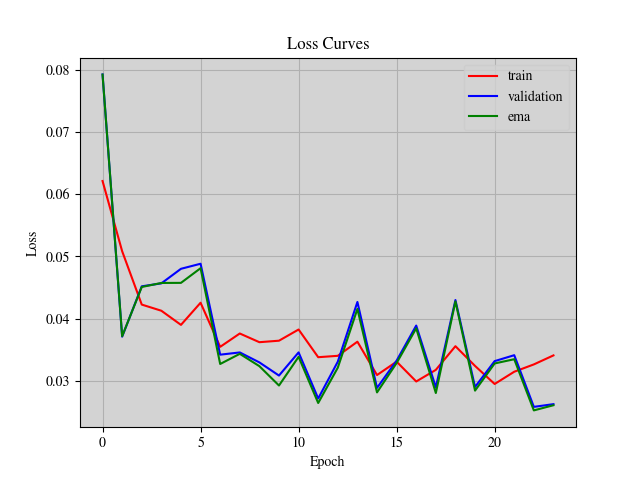

In [ ]:
cv2_imshow(
    cv2.imread(os.path.join(EXPERIMENT_DIR, "LDM_loss_plot.png"))
)

## **Inference**

## 重建图像 LDM

In [63]:
import os

ckpt_path = BEST_MODEL_PATH["LDM"]
print("Checkpoint path:", ckpt_path)
print("Exists:", os.path.exists(ckpt_path))
print("Size (bytes):", os.path.getsize(ckpt_path) if os.path.exists(ckpt_path) else "Not found")


Checkpoint path: drive/MyDrive/experiment/model/LDM_best.ckpt
Exists: True
Size (bytes): 421176114




==================={ LDM Reconstruction }===================


Noise Range: -0.9998969 to 0.9988072

Noise Level: 0.0%
Latent Image Range: -0.964 to 0.979


<Figure size 640x480 with 0 Axes>

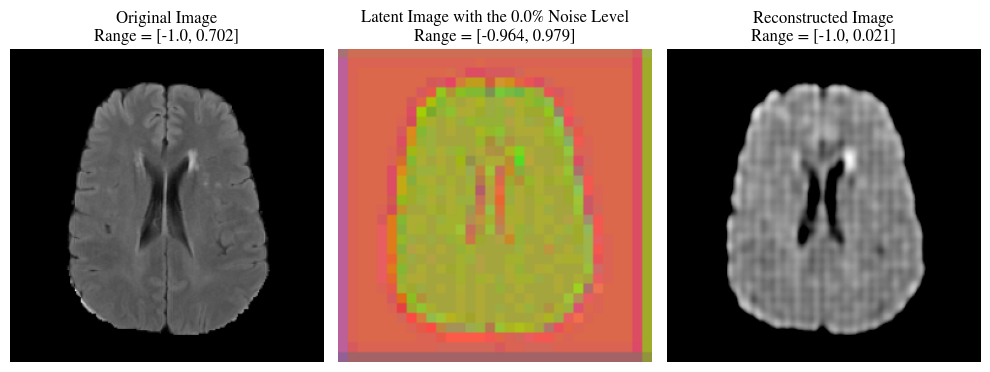


Noise Level: 11.11%
Latent Image Range: -0.945 to 0.93


<Figure size 640x480 with 0 Axes>

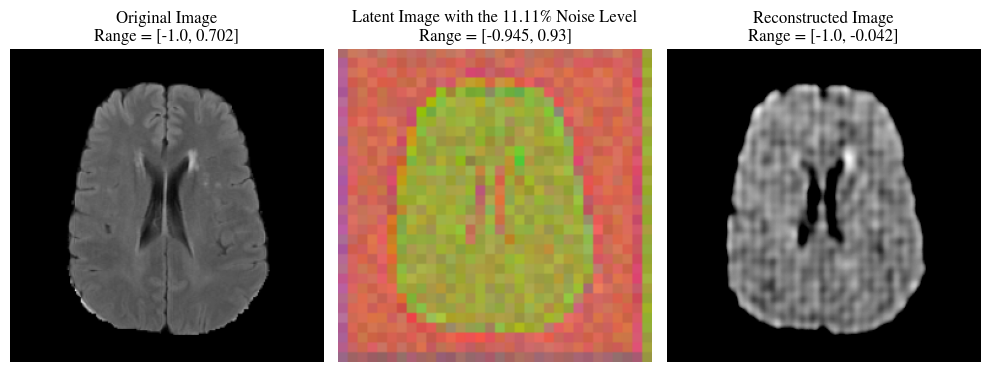


Noise Level: 22.22%
Latent Image Range: -0.952 to 0.895


<Figure size 640x480 with 0 Axes>

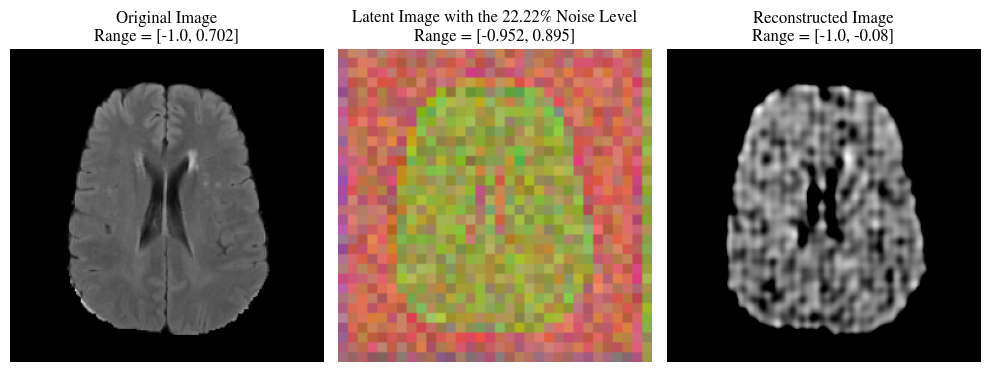


Noise Level: 33.33%
Latent Image Range: -0.959 to 0.889


<Figure size 640x480 with 0 Axes>

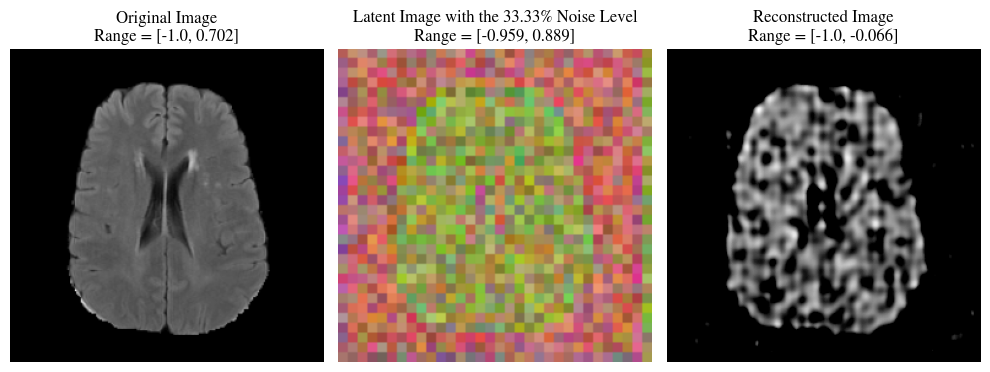


Noise Level: 44.44%
Latent Image Range: -0.965 to 0.882


<Figure size 640x480 with 0 Axes>

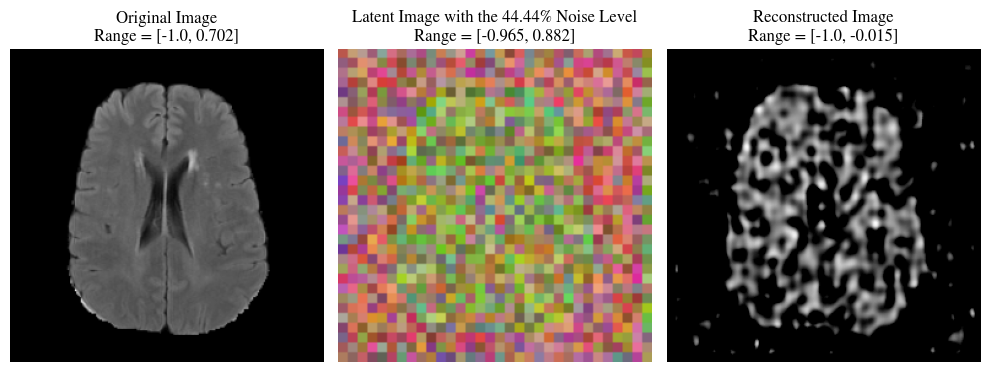


Noise Level: 55.56%
Latent Image Range: -0.972 to 0.893


<Figure size 640x480 with 0 Axes>

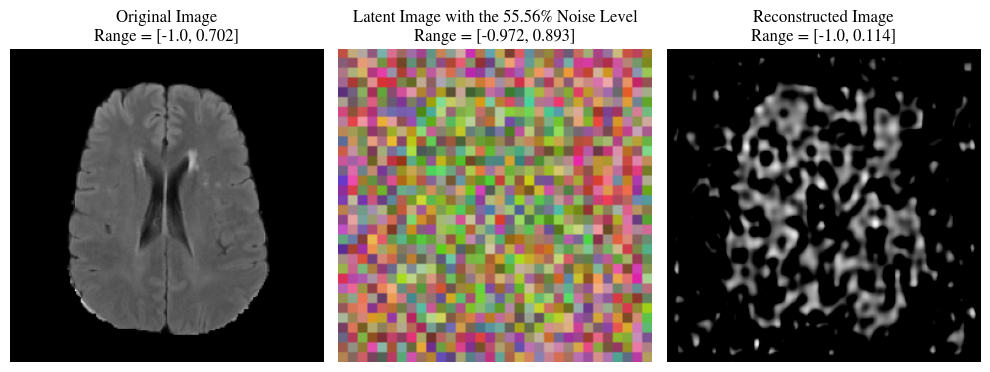


Noise Level: 66.67%
Latent Image Range: -0.978 to 0.91


<Figure size 640x480 with 0 Axes>

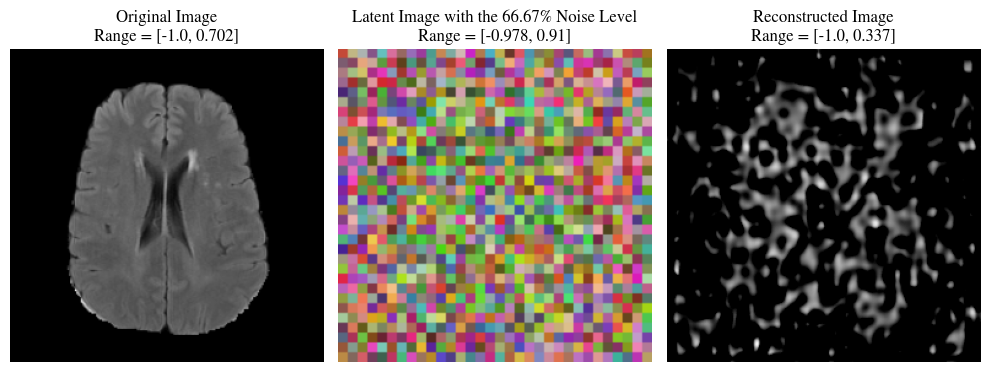


Noise Level: 77.78%
Latent Image Range: -0.985 to 0.937


<Figure size 640x480 with 0 Axes>

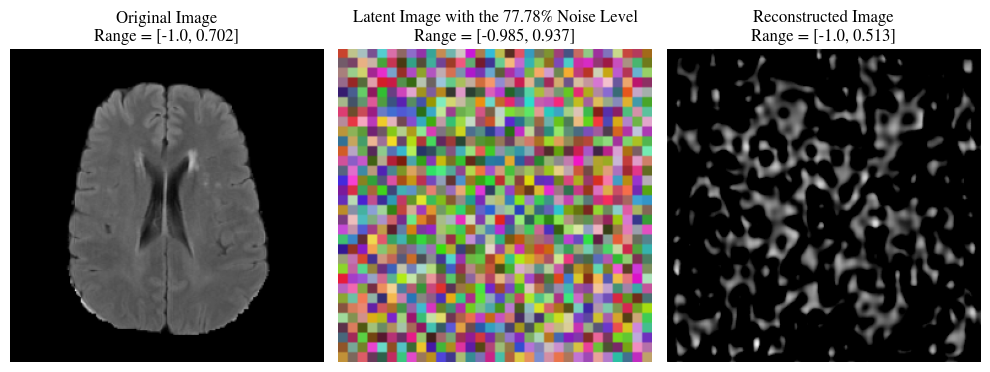


Noise Level: 88.89%
Latent Image Range: -0.992 to 0.967


<Figure size 640x480 with 0 Axes>

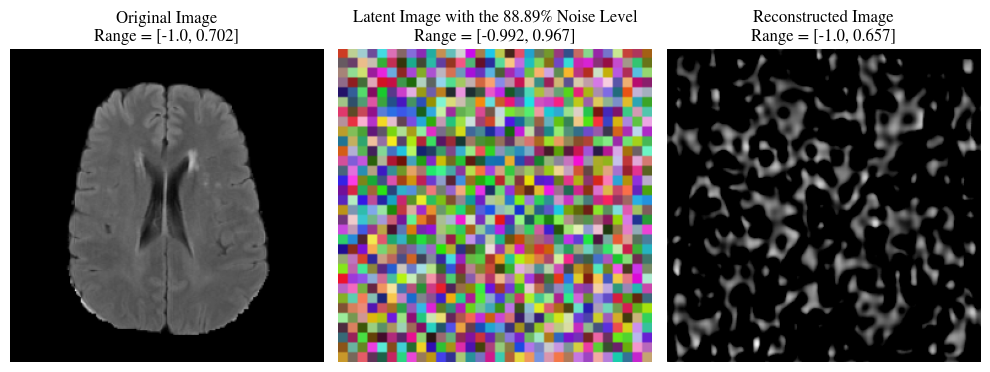


Noise Level: 100.0%
Latent Image Range: -1.0 to 0.999


<Figure size 640x480 with 0 Axes>

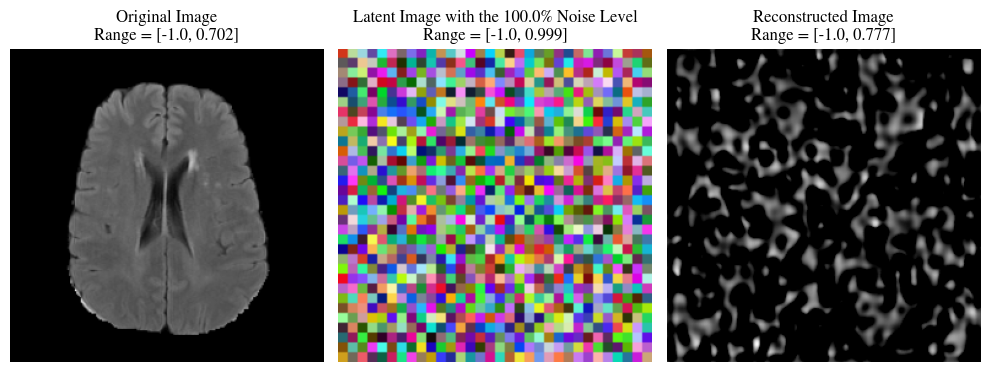

In [66]:
# Load the best model
vae_model = MODEL["VAE"].load_from_checkpoint(
    BEST_MODEL_PATH["VAE"],
    map_location="cuda" if torch.cuda.is_available() else "cpu"
).model

model = MODEL["LDM"].load_from_checkpoint(
    BEST_MODEL_PATH["LDM"],
    vae_model=vae_model,
    map_location="cuda" if torch.cuda.is_available() else "cpu"
)

model.eval()
model = model.to("cuda" if torch.cuda.is_available() else "cpu")


# Get a sample image from the dataset
image = next(iter(test_loader))
random_idx = np.random.randint(0, len(image))
image = image[random_idx:random_idx+1].to(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("\n\n==================={ LDM Reconstruction }===================\n\n")

# print(
#     "Label:",
#     list(LABEL.keys())[int(cls[random_idx:random_idx+1].cpu().numpy())]
# )

scale_factor = 8

noise = torch.randn_like(
    torch.randn(1, 3, IMAGE_SIZE // scale_factor, IMAGE_SIZE // scale_factor)
).to(
    "cuda" if torch.cuda.is_available() else "cpu"
)
torch.nn.init.uniform_(noise, -1., 1.)
print(
    "Noise Range:", noise.min().cpu().numpy(), "to", noise.max().cpu().numpy()
)

for scale in np.linspace(0, 1, 10):
    x_min = 0.
    x_max = 0.
    x_hat_min = 0.
    x_hat_max = 0.
    z_min = 0.
    z_max = 0.

    # Reconstruct the image using the loaded model
    with torch.no_grad():
        print(f"\nNoise Level: {round(scale * 100., 2)}%")
        z = model.vae_model.encode(image, inference=True)
        z = (1. - scale) * z + scale * noise
        z_min = round(float(z.min().cpu().numpy()), 3)
        z_max = round(float(z.max().cpu().numpy()), 3)
        print(f"Latent Image Range: {z_min} to {z_max}")
        x = model.vae_model.decode(z)

    # Process the output image
    z = F.interpolate(z, scale_factor=4, mode="nearest")
    z = torch.clamp(z, -1., 1.)
    latent_image = z.squeeze(0).permute(1, 2, 0).cpu().numpy()
    latent_image = (latent_image + 1) / 2
    latent_image = (latent_image * 255).astype("uint8")

    x_hat_min = round(float(x.min().cpu().numpy()), 3)
    x_hat_max = round(float(x.max().cpu().numpy()), 3)
    x = torch.clamp(x, -1., 1.)
    reconstructed_image = x.squeeze(0).permute(1, 2, 0).cpu().numpy()
    reconstructed_image = (reconstructed_image + 1) / 2
    reconstructed_image = (reconstructed_image * 255).astype("uint8")

    # Process the original image for display
    x_min = round(float(image.min().cpu().numpy()), 3)
    x_max = round(float(image.max().cpu().numpy()), 3)
    original_image = image.squeeze(0).permute(1, 2, 0).cpu().numpy()
    original_image = (original_image + 1) / 2
    original_image = (original_image * 255).astype("uint8")

    plt.clf()

    # Display images
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title(f"Original Image\nRange = [{x_min}, {x_max}]")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(latent_image, cmap='gray')
    plt.title(
        f"Latent Image with the {round(scale * 100., 2)}% Noise Level\n"
        f"Range = [{z_min}, {z_max}]"
    )
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(reconstructed_image, cmap='gray')
    plt.title(f"Reconstructed Image\nRange = [{x_hat_min}, {x_hat_max}]")
    plt.axis('off')

    plt.tight_layout()

    plt.show()

## Testing piexl-level

In [ ]:
from sklearn.metrics import average_precision_score
import torch
from tqdm import tqdm

def dice_score(pred, target, eps=1e-6):
    pred = (pred > 0.5).float()
    target = (target > 0.5).float()
    intersection = (pred * target).sum(dim=(1, 2, 3))
    union = pred.sum(dim=(1, 2, 3)) + target.sum(dim=(1, 2, 3))
    return ((2 * intersection + eps) / (union + eps)).mean().item()

def test_ldm_reconstruction(ldm_model, test_loader):
    ldm_model.eval()
    ldm_model.to("cuda" if torch.cuda.is_available() else "cpu")

    all_dice = []
    all_auprc = []

    with torch.no_grad():
        for x, mask in tqdm(test_loader):
            x = x.to(ldm_model.device)
            mask = mask.to(ldm_model.device)

            z = ldm_model.vae_model.encode(x, inference=True)
            x_hat = ldm_model.vae_model.decode(z)

            # Normalize to [0, 1]
            x = (x + 1) / 2
            x_hat = (x_hat + 1) / 2

            # Compute error map
            error_map = torch.abs(x - x_hat)

            # Resize error_map if needed to match mask
            if error_map.shape != mask.shape:
                error_map = torch.nn.functional.interpolate(
                    error_map, size=mask.shape[2:], mode="bilinear", align_corners=False
                )

            # Dice Score
            dice = dice_score(error_map, mask)
            all_dice.append(dice)

            # AUPRC
            auprc = average_precision_score(
                mask.flatten().cpu().numpy(), error_map.flatten().cpu().numpy()
            )
            all_auprc.append(auprc)

    print("\n📊 Pixel-level Anomaly Detection Evaluation")
    print(f"Average Dice Score : {sum(all_dice) / len(all_dice):.4f}")
    print(f"Average AUPRC      : {sum(all_auprc) / len(all_auprc):.4f}")


In [ ]:
# 加载训练好的 LDM 模型
ldm_model = LatentDiffusionWrapper.load_from_checkpoint(
    BEST_MODEL_PATH["LDM"],
    map_location="cuda" if torch.cuda.is_available() else "cpu"
)

# 执行测试
test_ldm_reconstruction(ldm_model, test_loader)


## Image-level valuation

In [139]:
from sklearn.metrics import roc_auc_score, average_precision_score, f1_score

vae_model = MODEL["VAE"].load_from_checkpoint(
    BEST_MODEL_PATH["VAE"],
    map_location="cuda" if torch.cuda.is_available() else "cpu"
).model

model = MODEL["LDM"].load_from_checkpoint(
    BEST_MODEL_PATH["LDM"],
    vae_model=vae_model,
    map_location="cuda" if torch.cuda.is_available() else "cpu"
)

model.eval()
model = model.to("cuda" if torch.cuda.is_available() else "cpu")


all_errors = []
all_labels = []

with torch.no_grad():
    for batch in test_loader:
        x, label = batch  # [B, 1, H, W], [B]
        x = x.to(device)
        label = label.to(device)

        # 重建
        z = model.vae_model.encode(x, inference=True)
        x_hat = model.vae_model.decode(z)

        # 缩放到 [0, 1] 区间
        x = (x + 1) / 2
        x_hat = (x_hat + 1) / 2

        # 计算 L2 重建误差
        error = torch.norm(x - x_hat, p=2, dim=(1, 2, 3))  # shape: [B]

        all_errors.append(error.cpu())
        all_labels.append(label.cpu())

# 拼接所有 batch 结果
errors = torch.cat(all_errors).numpy()
labels = torch.cat(all_labels).numpy()

# 设定 90% 分位数为 threshold
threshold = np.percentile(errors, 90)
preds = (errors >= threshold).astype(int)

# 🧪 计算图像级指标
auc = roc_auc_score(labels, errors)
auprc = average_precision_score(labels, errors)
f1 = f1_score(labels, preds)

print("\n📊 [LDM 图像级异常检测评估]")
print(f"AUC    : {auc:.4f}")
print(f"AUPRC  : {auprc:.4f}")
print(f"F1     : {f1:.4f}")


ValueError: too many values to unpack (expected 2)

In [99]:
def test_step(self, batch, batch_idx):
    x, label = batch
    x = x.to(self.device)
    label = label.to(self.device)

    with torch.no_grad():
        z = model.vae_model.encode(x, inference=True)
        x_hat = model.vae_model.decode(z)

        x = (x + 1) / 2
        x_hat = (x_hat + 1) / 2

        error = torch.norm(x - x_hat, p=2, dim=(1, 2, 3))  # [B]

    if not hasattr(self, "test_outputs"):
        self.test_outputs = {"errors": [], "labels": []}

    self.test_outputs["errors"].append(error.cpu())
    self.test_outputs["labels"].append(label.cpu())

def on_test_epoch_end(self):
    from sklearn.metrics import roc_auc_score, average_precision_score, f1_score

    errors = torch.cat(self.test_outputs["errors"], dim=0).numpy()
    labels = torch.cat(self.test_outputs["labels"], dim=0).numpy()

    # 排名前10%作为异常预测
    threshold = np.percentile(errors, 90)
    preds = (errors >= threshold).astype(int)

    # 计算评估指标
    auc = roc_auc_score(labels, errors)
    auprc = average_precision_score(labels, errors)
    f1 = f1_score(labels, preds)

    print("\n📊 [LDM 图像级异常检测评估]")
    print(f"AUC    : {auc:.4f}")
    print(f"AUPRC  : {auprc:.4f}")
    print(f"F1     : {f1:.4f}")

    # 清理缓存
    del self.test_outputs



In [100]:
# 加载 VAE 模型
vae_model = MODEL["VAE"].load_from_checkpoint(
    BEST_MODEL_PATH["VAE"],
    map_location="cuda" if torch.cuda.is_available() else "cpu"
).model

# 加载训练好的 LDM 模型
model = MODEL["LDM"].load_from_checkpoint(
    BEST_MODEL_PATH["LDM"],
    vae_model=vae_model,
    map_location="cuda" if torch.cuda.is_available() else "cpu"
)
model.eval()

# datamodule = MedicalDataModule()
# datamodule.setup(stage="test")

trainer = Trainer(
    accelerator="auto",
    devices=1
)

# ⚠️ 自动调用 test_step 和 on_test_epoch_end
trainer.test(ldm_model, datamodule=datamodule)




INFO: You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO:lightning.pytorch.utilities.rank_zero:You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


MisconfigurationException: No `test_step()` method defined to run `Trainer.test`.

In [92]:
from sklearn.metrics import roc_auc_score, average_precision_score, f1_score

ldm_model.eval()
device = "cuda" if torch.cuda.is_available() else "cpu"

errors = []
labels = []

with torch.no_grad():
    for batch in test_loader:
        x, label = batch
        x = x.to(device)
        label = label.to(device)

        # LDM 生成重建图像
        z = ldm_model.vae_model.encode(x, inference=True)
        x_hat = ldm_model.vae_model.decode(z)

        # 反归一化
        x = (x + 1) / 2
        x_hat = (x_hat + 1) / 2

        error = torch.norm(x - x_hat, p=2, dim=(1, 2, 3))  # [B]
        errors.append(error.cpu())
        labels.append(label.cpu())

# 拼接为完整数组
errors = torch.cat(errors).numpy()
labels = torch.cat(labels).numpy()

# 设置 threshold 和预测
threshold = np.percentile(errors, 90)
preds = (errors >= threshold).astype(int)

# 评估指标
auc = roc_auc_score(labels, errors)
auprc = average_precision_score(labels, errors)
f1 = f1_score(labels, preds)

print("\n📊 [LDM 图像级异常检测评估]")
print(f"AUC    : {auc:.4f}")
print(f"AUPRC  : {auprc:.4f}")
print(f"F1     : {f1:.4f}")


ValueError: too many values to unpack (expected 2)

In [93]:
batch = next(iter(test_loader))
print(type(batch))
if isinstance(batch, (list, tuple)):
    print(f"Batch length: {len(batch)}")
    for i, item in enumerate(batch):
        print(f"Item {i} shape: {item.shape}")
else:
    print(f"Batch shape: {batch.shape}")


<class 'torch.Tensor'>
Batch shape: torch.Size([13, 1, 256, 256])


## **Utils**

In [ ]:
def decode_captions(txt):
    if txt == "Normal":
        return "Normal Lungs"
    elif txt == "Pneumonia":
        return "Lungs with Pneumonia"

In [ ]:
def animate_result(
    image_tensors,
    caption,
    output_filename=os.path.join(
        EXPERIMENT_DIR,
        "animation.gif",
    ),
):
    """
    Creates a GIF from a list of PyTorch image tensors
    with a caption.

    Args:
      image_tensors: A list of PyTorch image tensors.
                     Assumed to be in CHW format,
                     and values normalized to [-1, 1].
      caption: The caption to display below the GIF.
      output_filename: The filename for the output GIF.
    """
    fig, ax = plt.subplots(
        gridspec_kw=
         {
             'wspace':0,
             'hspace':2,
             'right':1,
             'left':0,
         }
      )

    # Remove axes ticks and labels
    ax.set_xticks([])
    ax.set_yticks([])
    ax.axis('off')

    imgs = list()
    for idx, image_tensor in enumerate(image_tensors):
        # Assuming the tensor is in CHW format.
        assert len(image_tensor.shape) == 4, "Expected 4D tensor"

        # Convert to HWC and to numpy.
        if image_tensor.shape[1] == 3:
            image_np = F.interpolate(
                image_tensor, scale_factor=4,
            ).squeeze(0).permute(1, 2, 0).cpu().numpy()
        else:
            image_np = image_tensor.repeat(
                1, 3, 1, 1
            ).squeeze(0).permute(
                1, 2, 0
            ).cpu().numpy()

        # Scale to 0-255 range and convert to uint8.
        image_np = (image_np + 1) / 2 # Rescale to 0-1
        image_np = (image_np * 255).astype('uint8')

        if idx == len(image_tensors) - 1:
            for _ in range(32):
                img = ax.imshow(image_np)
                imgs.append([img])
        else:
            img = ax.imshow(image_np, aspect='auto')
            imgs.append([img])

    plt.tight_layout()

    # Add caption
    plt.figtext(
        0.5,
        0.05,
        caption,
        wrap=True,
        horizontalalignment='center',
        fontsize=16,
    )

    anim = animation.ArtistAnimation(
        fig,
        imgs,
        interval=256,
        blit=True,
        repeat_delay=1000,
    )
    anim.save(output_filename)

    plt.close(fig)

### **Sampling**

In [ ]:
SELECT_CLASS = 'pneumonia' #@param ['normal', 'pneumonia', 'None']
USE_EMA = 'True' #@param ['True', 'False']
CLASSIFIER_FREE_GUIDANCE_SCALE = 1.069 # @param {type:"slider", min:0, max:3, step:0.001}

vae_model = MODEL['VAE'].load_from_checkpoint(
    BEST_MODEL_PATH['VAE'],
    map_location=(
        "cuda" if torch.cuda.is_available() else "cpu"
    ),
).model

model = MODEL['LDM'].load_from_checkpoint(
    BEST_MODEL_PATH['LDM'],
    map_location=(
        "cuda" if torch.cuda.is_available() else "cpu"
    ),
    vae_model=vae_model,
)

context = (
    None
    if SELECT_CLASS == 'None'
    else LABEL[SELECT_CLASS]
)
USE_EMA = True if USE_EMA == "True" else False

progress, progress_decoded = model(
    context,
    inference=True,
    use_ema=USE_EMA,
    cfg_scale=CLASSIFIER_FREE_GUIDANCE_SCALE,
)

0it [00:00, ?it/s]

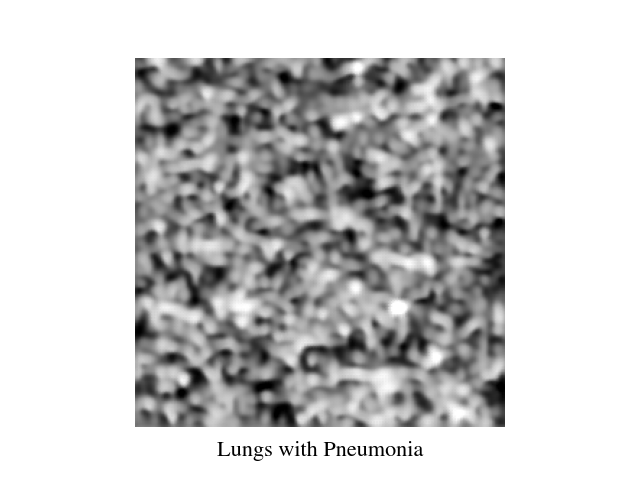

In [ ]:
#### Generated Image

animate_result(
    progress_decoded,
    decode_captions(SELECT_CLASS.title())
    if SELECT_CLASS != "None"
    else "Unconditional Progressive Generation of Chest X-Ray",
    output_filename=os.path.join(
        EXPERIMENT_DIR,
        f"{SELECT_CLASS.lower()}.gif",
    ),
)
ImageColab(filename=os.path.join(EXPERIMENT_DIR, f"{SELECT_CLASS.lower()}.gif"))

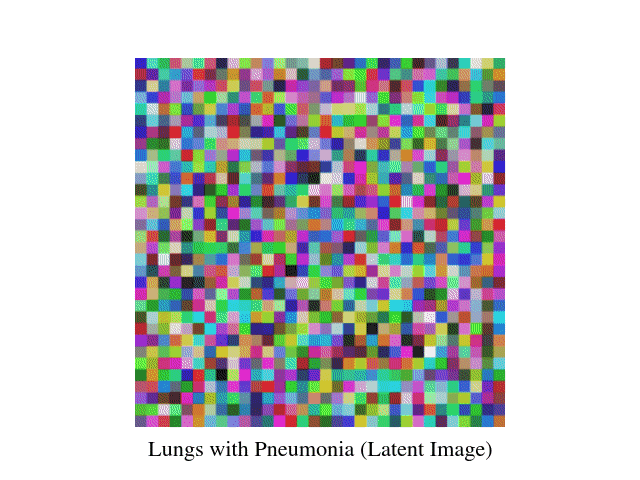

In [ ]:
#### Denoised Latent Image

animate_result(
    progress,
    (
        decode_captions(SELECT_CLASS.title())
        if SELECT_CLASS != "None"
        else "Unconditional Progressive Generation of Chest X-Ray"
    ) + (
        " (Latent Image)"
    ),
    output_filename=os.path.join(
        EXPERIMENT_DIR,
        f"{SELECT_CLASS.lower()}_latent.gif",
    ),
)
ImageColab(
    filename=os.path.join(EXPERIMENT_DIR, f"{SELECT_CLASS.lower()}_latent.gif")
)